In [1]:
import sys
sys.path.append("../SpikeCounter")
import numpy as np
import skimage.io as skio
import scipy.ndimage as ndi
import scipy.signal as signal
import scipy.stats as stats
import scipy.fft as fft
import skimage.morphology as morphology
from skimage.measure import label
import matplotlib.pyplot as plt
import skimage.transform as transform
from tifffile import imsave
import scipy.ndimage as ndimage
import matplotlib.colors as colors
import matplotlib.patches as patches
import colorcet as cc
from cycler import cycler
import os
from scipy import interpolate, optimize
import skimage.filters as filters
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import time
import mat73
import pandas as pd
import parse
import traceback
import importlib


from spikecounter.analysis import traces, images
from spikecounter.ui import visualize, HyperStackViewer
from spikecounter import utils

plt.style.use("../bio_pubs_presentation.mplstyle")
ss = StandardScaler()

In [34]:
importlib.reload(images)

<module 'spikecounter.analysis.images' from '/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py'>

In [3]:
rootdir = "/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/"

Identify videos with successfully denoised data

In [4]:
expt_info = pd.read_csv(os.path.join(rootdir,"analysis/experiment_data.csv")).sort_values("start_time").reset_index()

In [5]:
denoised_experiments = sorted([parse.parse("{}.tif", f)[0] for f in \
                        os.listdir(os.path.join(rootdir,"denoised"))])

In [6]:
del expt_info["index"]

## Load image

In [35]:
def image_to_sta(raw_img, fs=1, mask=None, plot=False, \
                 savedir=None, prom_pct=90, sta_bounds="auto", \
                 exclude_pks = None, offset=0, full_output=False):
    """ Convert raw image into spike triggered average
    """
    if savedir is not None:
        os.makedirs(savedir, exist_ok=True)

    if plot:
        fig1, axes = plt.subplots(2,2, figsize=(10,10))
        axes = axes.ravel()

    # Generate mask if not provided
    mean_img = raw_img.mean(axis=0)
    if mask is None:
        mask = mean_img > np.percentile(mean_img, 80)
        kernel_size = int(mask.shape[0]/50)
        mask = morphology.binary_closing(mask, footprint=np.ones((kernel_size, kernel_size)))
    _ = visualize.display_roi_overlay(mean_img, mask.astype(int), ax=axes[0])
    
    raw_trace = images.extract_mask_trace(raw_img, np.tile(mask, (raw_img.shape[0], 1, 1)))
    
    # convert to DF/F
    
    dFF_img = images.get_image_dFF(raw_img)
    
    if savedir:
        skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)

    dFF_mean = images.extract_mask_trace(dFF_img, mask=np.tile(mask, (dFF_img.shape[0], 1, 1)))

    # Identify spikes
    ps = np.percentile(dFF_mean,[10,prom_pct])
    prominence = ps[1] - ps[0]
    pks, _ = signal.find_peaks(dFF_mean, prominence=prominence, width=(70, None))
    
    if exclude_pks:
        keep = np.ones(len(pks))
        keep[exclude_pks] = 0
        pks = pks[keep]

    if plot:
        axes[1].plot(np.arange(dFF_img.shape[0])/fs, dFF_mean)
        axes[1].plot(pks/fs, dFF_mean[pks], "rx")
        axes[1].set_xlabel("Time (s)")
        axes[1].set_ylabel(r"$F/F_0$")
        tx = axes[1].twinx()
        tx.plot(np.arange(dFF_img.shape[0])/fs, raw_trace, color="C1")
        tx.set_ylabel("Mean counts")

    # Automatically determine bounds for spike-triggered average
    if sta_bounds == "auto":
        try:
        # Align all detected peaks of the full trace and take the mean
            aligned_traces = traces.align_fixed_offset(np.tile(dFF_mean, (len(pks), 1)), pks)
        except Exception as e:
            print(e)
            return raw_trace
        mean_trace = np.nanmean(aligned_traces, axis=0)
        # Smooth
        spl = interpolate.UnivariateSpline(np.arange(len(mean_trace)), \
                                np.nan_to_num(mean_trace, nan=np.nanmin(mean_trace)), s=0.001)
        smoothed = spl(np.arange(len(mean_trace)))
        smoothed_dfdt = spl.derivative()(np.arange(len(mean_trace)))   
        # Find the first minimum before and the first minimum after the real spike-triggered peak
        if plot:
            axes[3].plot(mean_trace)
            axes[3].plot(smoothed, color="C1")
            tx = axes[3].twinx()
            tx.plot(smoothed_dfdt, color="C2")
            tx.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
        try:
            minima_left = np.argwhere((smoothed_dfdt < 0)).ravel()
            minima_right = np.argwhere((smoothed_dfdt > 0)).ravel()
            # calculate number of samples to take before and after the peak
            b1 = pks[-1] - minima_left[minima_left<pks[-1]][-1]+offset
            b2 = minima_right[minima_right > pks[-1]][0] - pks[-1]+offset
        except Exception:
            return mean_trace
        
        if plot:
            axes[3].plot([pks[-1]-b1, pks[-1], pks[-1]+b2], mean_trace[[pks[-1]-b1, pks[-1], pks[-1]+b2]], "rx")
    else:
        b1, b2 = sta_bounds    


    # Collect spike traces according to bounds
    spike_traces = np.nan*np.ones((len(pks), b1+b2))
    spike_images = np.nan*np.ones((len(pks), b1+b2, dFF_img.shape[1], dFF_img.shape[2]))
    print(b1,b2)
    for idx, pk in enumerate(pks):
        n_prepend = max(0, b1-pk)
        n_append = max(0, pk+b2-len(dFF_mean))

        mean_block = np.concatenate([np.ones(n_prepend)*np.nan, dFF_mean[max(0, pk-b1):min(len(dFF_mean), pk+b2)], np.ones(n_append)*np.nan])
        img_block = np.concatenate([np.ones((n_prepend, dFF_img.shape[1], dFF_img.shape[2]))*np.nan, \
                                    dFF_img[max(0, pk-b1):min(len(dFF_mean), pk+b2),:,:], np.ones((n_append, dFF_img.shape[1], dFF_img.shape[2]))*np.nan])
        
        spike_traces[idx,:] = mean_block
        spike_images[idx,:,:] = img_block
    
    sta_trace = np.nanmean(spike_traces, axis=0)
    sta = np.nanmean(spike_images, axis=0)

    if plot:
        axes[2].plot(np.arange(b1+b2)/fs, sta_trace)
        axes[2].set_xlabel("Time (s)")
        axes[2].set_ylabel(r"$F/F_0$")
        axes[2].set_title("STA taps: %d + %d" % (b1,b2))
        plt.tight_layout()
    if savedir:
        skio.imsave(os.path.join(savedir, "sta.tif"), sta)
        if plot:
            plt.savefig(os.path.join(savedir, "QA_plots.tif"))
    if full_output:
        return sta, spike_images
    return sta

In [36]:
filename = "091430E14_gcamp_fast"
subfolder = "stim_frames_removed"
print(filename)
img, expt_data = images.load_image(rootdir, filename, subfolder=subfolder)
print(img.shape)

091430E14_gcamp_fast
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/091430E14_gcamp_fast/Sq_camera.bin'
(3000, 176, 176)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


In [29]:
dt_dict, t = utils.traces_to_dict(expt_data)
dt = np.mean(np.diff(t))

/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091430E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091430E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)


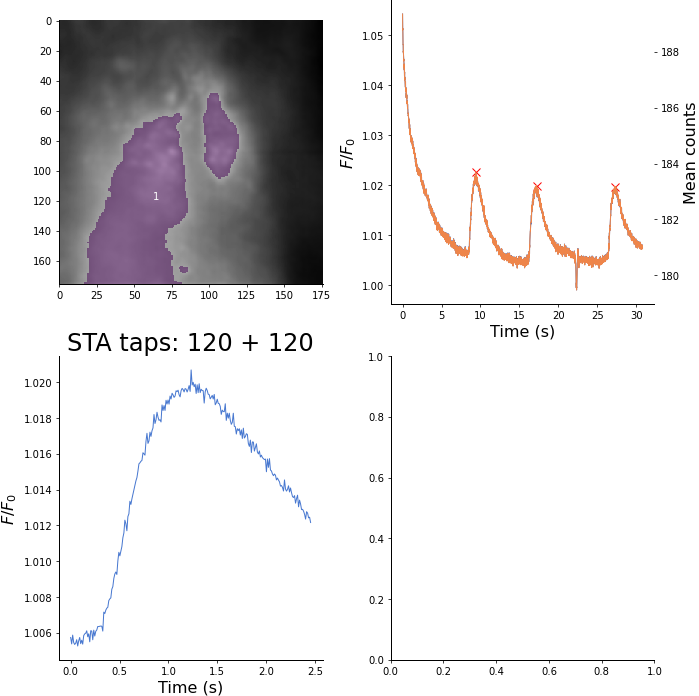

In [37]:
sta, spike_images = image_to_sta(img, fs=1/dt, plot=True, prom_pct=80, \
                   savedir=os.path.join(rootdir, "analysis", subfolder, filename), offset=120,\
                    sta_bounds =(120, 120), full_output=True)

In [38]:
utils.display_zstack(sta[:,:,:, np.newaxis], c=0, pct_cutoffs=[5,99])

interactive(children=(IntSlider(value=119, description='z', max=239), Dropdown(description='c', options=('all'…

[8.60000000e+01 4.33328397e+01 1.00781000e+00 3.40766541e-03
 4.34410582e+01]


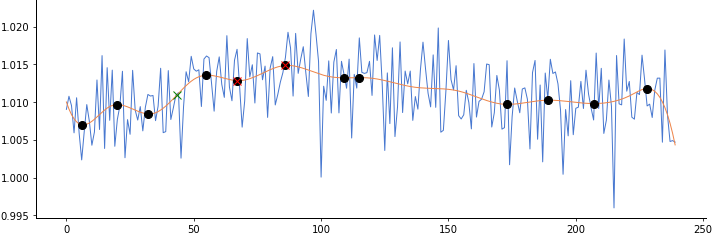

In [25]:
s = 0.05
n_knots = 15
beta, spl, ax1 = images.spline_fit_single_trace(sta[:,114,0], s,\
                               np.linspace(0, sta.shape[0]-1, num=n_knots)[1:-1], plot=True)
print(beta)

In [39]:
beta, smoothed_vid = images.spline_timing(sta, s=0.05, n_knots=15)

/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

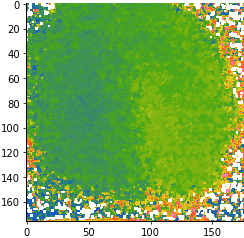

In [40]:
plt.imshow(beta[4])

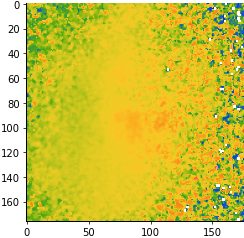

In [32]:
plt.imshow(beta[1])

In [33]:
utils.display_zstack(smoothed_vid[:,:,:, np.newaxis], c=0, pct_cutoffs=[5,99])

interactive(children=(IntSlider(value=119, description='z', max=239), Dropdown(description='c', options=('all'…

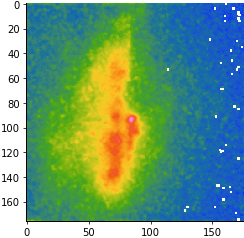

In [34]:
plt.imshow(beta[2,:,:])

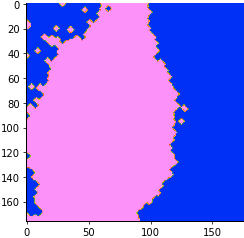

In [35]:
amplitude = beta[2,:,:]
amplitude_nan_removed = np.copy(amplitude)
minval = np.nanmin(amplitude)
amplitude_nan_removed[np.isnan(amplitude)] = minval
thresh = np.percentile(amplitude_nan_removed,40)
# thresh = filters.threshold_otsu(amplitude_nan_removed)
mask = amplitude_nan_removed>thresh
mask = morphology.binary_opening(mask, footprint=morphology.disk(2))
mask = morphology.binary_closing(mask, footprint=morphology.disk(2))
plt.imshow(mask)

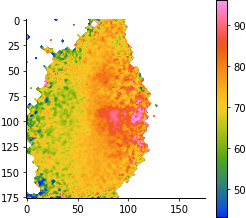

In [36]:
fig1, ax1 = plt.subplots(figsize=(4,4))
hm = beta[1,:,:]
hm_nan = np.copy(hm)
hm_nan[~mask] = np.nan
hm_nan = hm_nan-np.nanmin(hm_nan)
im = ax1.imshow(hm_nan, vmin=np.percentile(hm_nan[~np.isnan(hm_nan)],1), \
               vmax=np.percentile(hm_nan[~np.isnan(hm_nan)],99))
plt.colorbar(im, ax=ax1)

In [37]:
skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)
np.savez(os.path.join(rootdir, "analysis", subfolder, "%s_snapt.npz") % filename,\
         beta=beta)

/tmp/ipykernel_233480/1262885674.py:1: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/corrected/102308E12_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/082514E2_gcamp/Sq_camera.bin'
082514E2_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/082514E2_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:25:14', '082514E2_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/083558E4_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


083558E4_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/083558E4_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:35:58', '083558E4_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/083838E5_gcamp/Sq_camera.bin'
083838E5_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/083838E5_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:38:38', '083838E5_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/084439E6_gcamp/Sq_camera.bin'
084439E6_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/084439E6_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:44:39', '084439E6_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/084853E7_gcamp/Sq_camera.bin'
084853E7_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/084853E7_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:48:53', '084853E7_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/085936E12_gcamp/Sq_camera.bin'
085936E12_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/085936E12_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('08:59:36', '085936E12_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/091218E14_gcamp/Sq_camera.bin'
091218E14_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091218E14_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:12:18', '091218E14_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/091430E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


091430E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091430E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091430E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091430E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)
/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


('09:14:30', '091430E14_gcamp_fast', 0.09737098344693282)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/091725E15_gcamp/Sq_camera.bin'
091725E15_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091725E15_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

('09:17:25', '091725E15_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/091934E16_gcamp/Sq_camera.bin'
091934E16_gcamp


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/091934E16_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:19:34', '091934E16_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/092131E17_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


092131E17_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/092131E17_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:21:31', '092131E17_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/092355E18_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


092355E18_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/092355E18_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:23:55', '092355E18_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/092706E1_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


092706E1_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/092706E1_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:27:06', '092706E1_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/092945E2_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


092945E2_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/092945E2_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)


120 120


/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:29:45', '092945E2_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/093144E4_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


093144E4_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093144E4_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:31:44', '093144E4_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/093344E5_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


093344E5_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093344E5_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:33:44', '093344E5_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/093503E6_gcamp/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 7 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


093503E6_gcamp


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093503E6_gcamp/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)


120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


('09:35:03', '093503E6_gcamp', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/093930E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


093930E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093930E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093930E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/093930E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('09:39:30', '093930E14_gcamp_fast', 0.03245699448231094)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/095534E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


095534E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/095534E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/095534E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/095534E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('09:55:34', '095534E14_gcamp_fast', 0.12982797792924375)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/100301E18_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


100301E18_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/100301E18_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

('10:03:01', '100301E18_gcamp_fast', 0.0)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/100807E2_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))
/tmp/ipykernel_195397/1309699428.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, axes = plt.subplots(2,2, figsize=(10,10))


100807E2_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/100807E2_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:102: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_195397/1309699428.py:103: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

('10:08:07', '100807E2_gcamp_fast', 0.03245699448231094)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/101424E6_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


101424E6_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('10:14:24', '101424E6_gcamp_fast', 0.12982797792924375)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/102308E12_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


102308E12_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102308E12_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102308E12_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102308E12_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:23:08', '102308E12_gcamp_fast', 0.12982797792924375)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/102556E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


102556E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102556E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102556E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/102556E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:25:56', '102556E14_gcamp_fast', 0.1622849724115547)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/103436E16_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


103436E16_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103436E16_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103436E16_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103436E16_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:34:36', '103436E16_gcamp_fast', 0.22719896137617657)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/103753E18_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


103753E18_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103753E18_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103753E18_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/103753E18_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:37:53', '103753E18_gcamp_fast', 0.09737098344693282)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/104140E1_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


104140E1_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('10:41:40', '104140E1_gcamp_fast', 0.12982797792924375)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/104310E2_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


104310E2_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/104310E2_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/104310E2_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cre

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/104310E2_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:43:10', '104310E2_gcamp_fast', 0.12982797792924375)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/104720E6_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


104720E6_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('10:47:20', '104720E6_gcamp_fast', 0.19474196689386564)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/105326E12_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


105326E12_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105326E12_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105326E12_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105326E12_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:53:26', '105326E12_gcamp_fast', 0.19474196689386564)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/105603E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


105603E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105603E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105603E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105603E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:56:03', '105603E14_gcamp_fast', 0.2596559558584875)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/105802E15_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


105802E15_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105802E15_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105802E15_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/105802E15_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('10:58:02', '105802E15_gcamp_fast', 0.2921129503407984)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/110028E17_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


110028E17_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('11:00:28', '110028E17_gcamp_fast', 0.09737098344693282)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/110222E18_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


110222E18_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110222E18_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110222E18_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110222E18_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:02:22', '110222E18_gcamp_fast', 0.09737098344693282)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/110512E1_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


110512E1_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('11:05:12', '110512E1_gcamp_fast', 0.09737098344693282)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/110705E2_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


110705E2_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110705E2_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110705E2_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cre

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/110705E2_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:07:05', '110705E2_gcamp_fast', 0.1622849724115547)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/110902E6_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


110902E6_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('11:09:02', '110902E6_gcamp_fast', 0.3894839337877313)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/111108E12_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


111108E12_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111108E12_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111108E12_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111108E12_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:11:08', '111108E12_gcamp_fast', 0.03245699448231094)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/111238E14_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


111238E14_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111238E14_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111238E14_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111238E14_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:12:38', '111238E14_gcamp_fast', 0.22719896137617657)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/111428E15_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 6 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


111428E15_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111428E15_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111428E15_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111428E15_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:14:28', '111428E15_gcamp_fast', 0.2921129503407984)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/111608E17_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 3 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


111608E17_gcamp_fast
120 120


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
('11:16:08', '111608E17_gcamp_fast', 0.19474196689386564)
[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/stim_frames_removed/111750E18_gcamp_fast/Sq_camera.bin'


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:92: UserWarning: 17 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


111750E18_gcamp_fast


/tmp/ipykernel_195397/1309699428.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111750E18_gcamp_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


120 120


/tmp/ipykernel_195397/1309699428.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111750E18_gcamp_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cr

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

/tmp/ipykernel_195397/1978640917.py:21: UserWarning: /n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/stim_frames_removed/111750E18_gcamp_fast/spline_smoothed_vid.tif is a low contrast image
  skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)


('11:17:50', '111750E18_gcamp_fast', 0.0973709834469328)


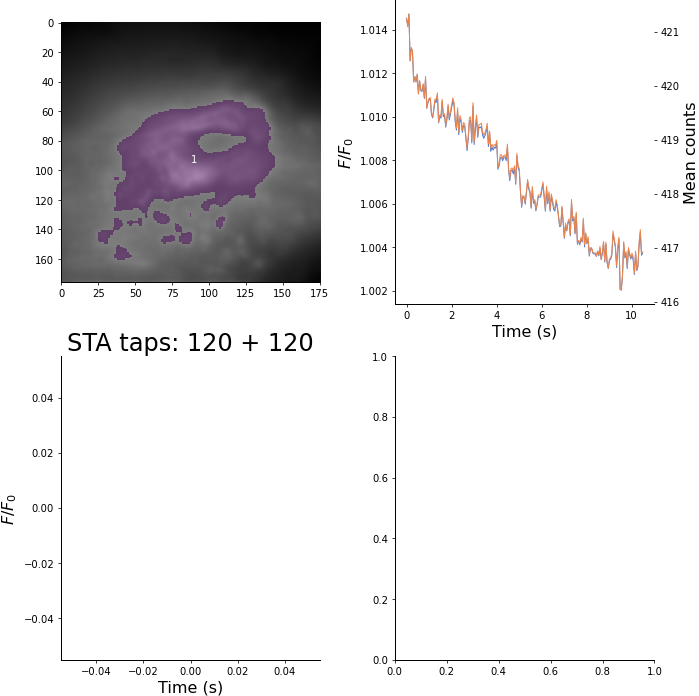

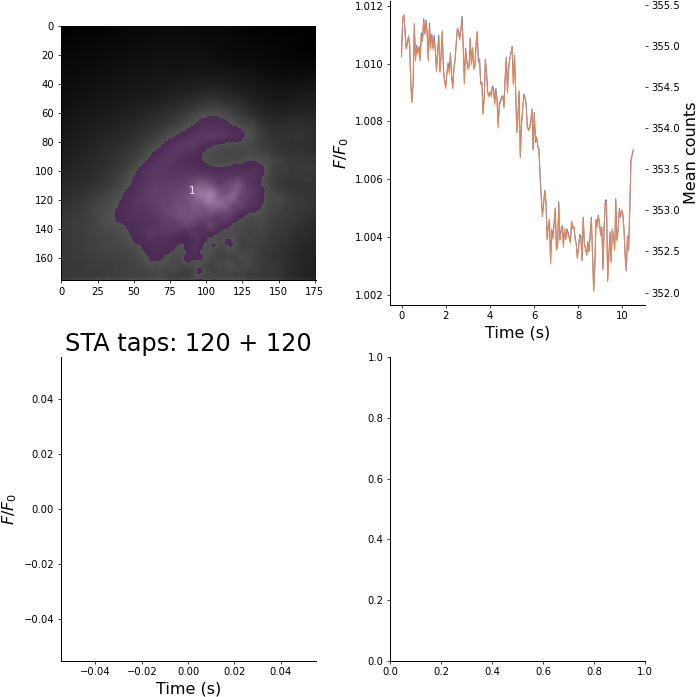

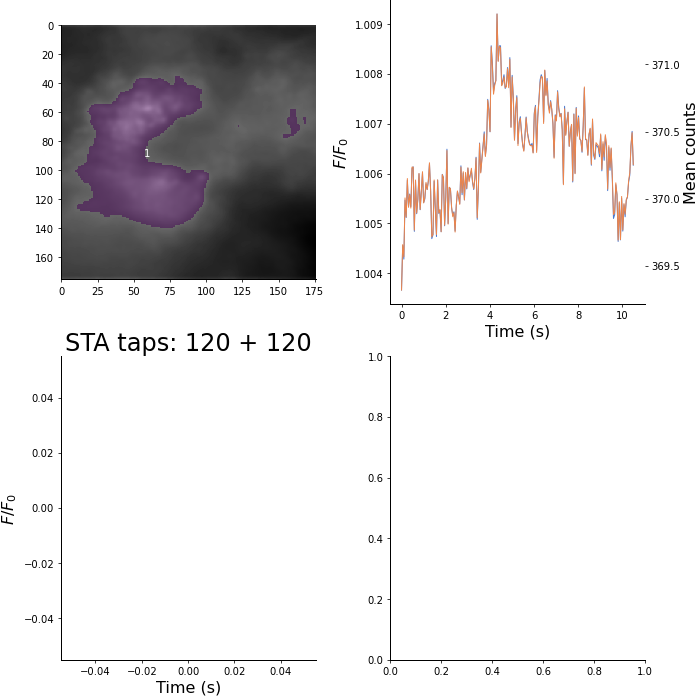

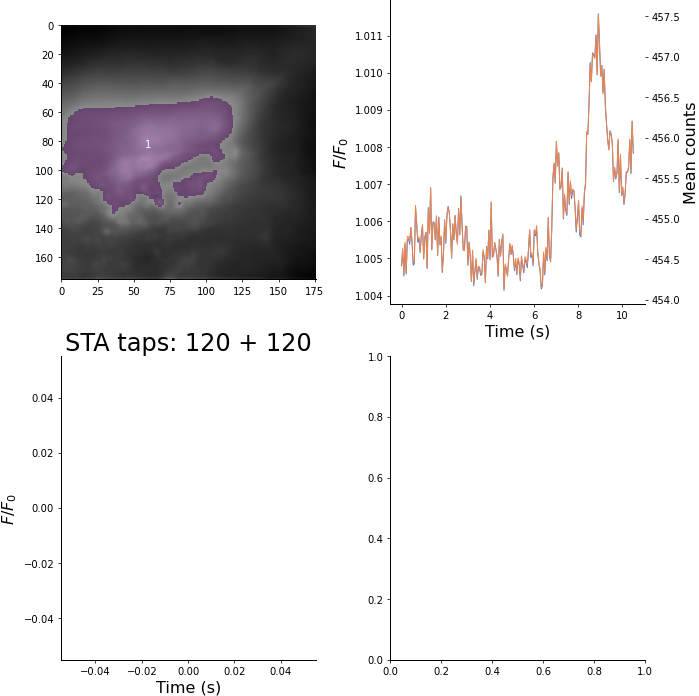

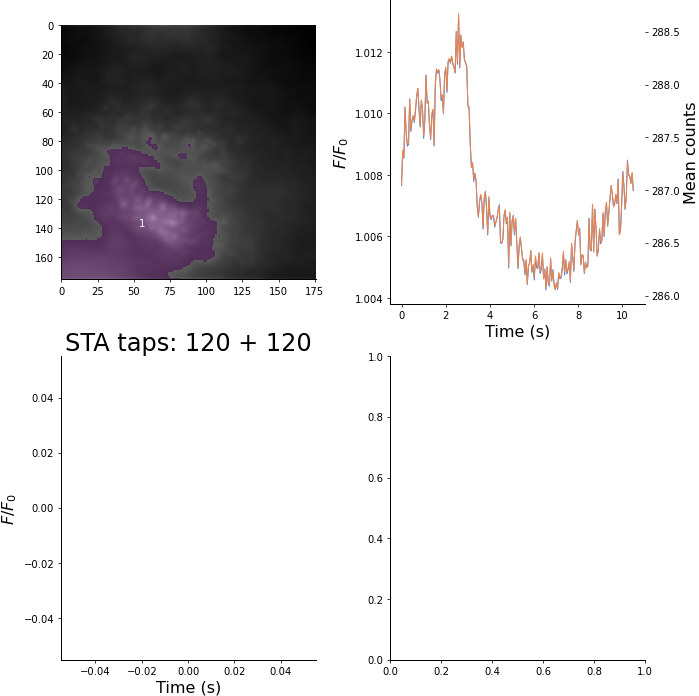

...

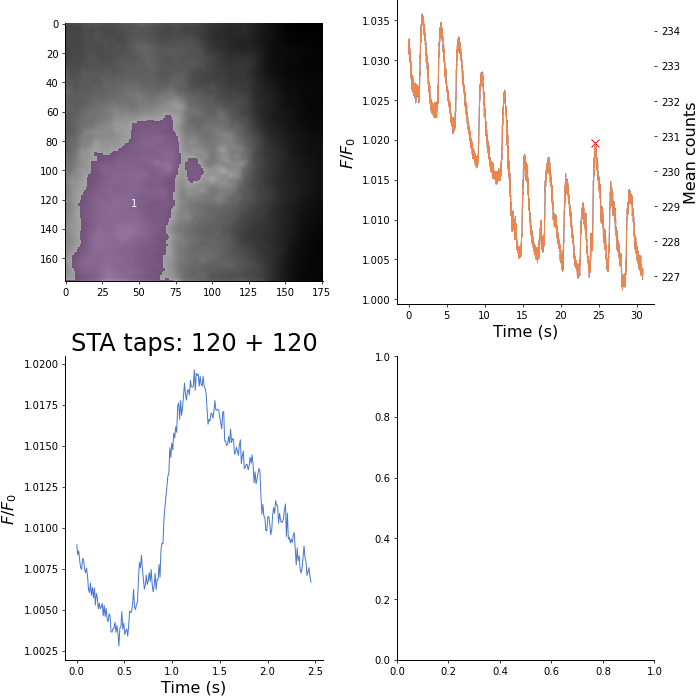

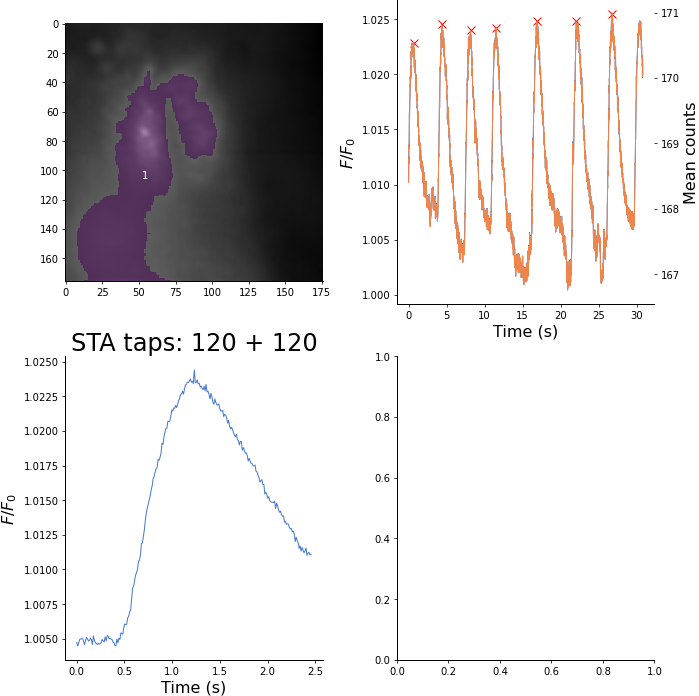

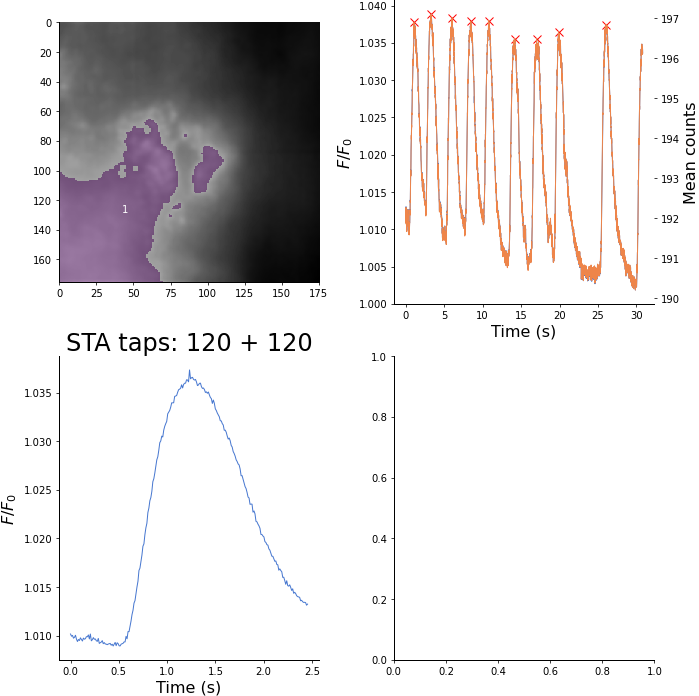

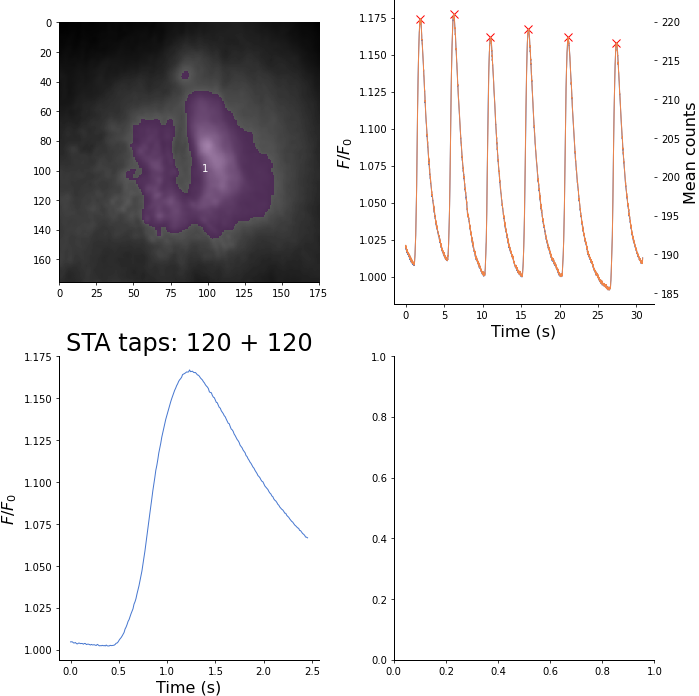

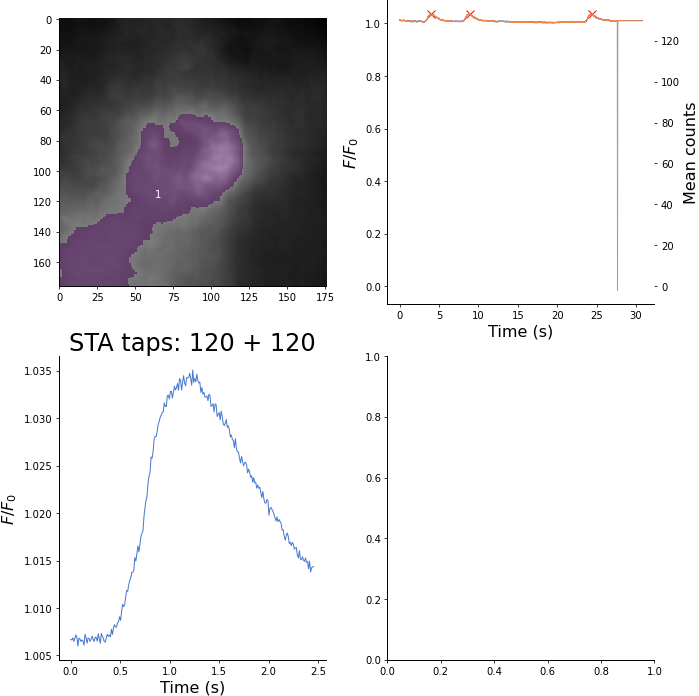

In [41]:
%matplotlib inline
plt.close("all")
subfolder = "stim_frames_removed"
data = []
for i in range(expt_info.shape[0]):
    f = expt_info.iloc[i]["file_name"]
    if f in denoised_experiments:
        filename, _ = os.path.splitext(f)
        os.makedirs(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes"), exist_ok=True)
        img, expt_data = images.load_image(rootdir, filename, subfolder=subfolder)
        expt_dict, t = utils.traces_to_dict(expt_data)
        dt = np.mean(np.diff(t))
        print(filename)
        try:
            sta, spike_images = image_to_sta(img, fs=1/dt, plot=True, prom_pct=65, \
                               savedir=os.path.join(rootdir, "analysis", subfolder, filename), offset=120,\
                                             sta_bounds=(120,120), full_output=True)
            freq = spike_images.shape[0]/(img.shape[0]*dt)
            
            beta, smoothed_vid = images.spline_timing(sta, s=0.05, n_knots=15)
            skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)
            np.savez(os.path.join(rootdir, "analysis", subfolder, "%s_snapt.npz") % filename,\
                     beta=beta)
            betas_individual = []
            smoothed_vids_individual = []
#             for j in range(spike_images.shape[0]):
#                 b, sv = images.spline_timing(spike_images[j,:,:,:], s=0.05, n_knots=15)
#                 np.savez(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes", "spike%d.npz" % j),\
#                      beta=b)
#                 skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes", "spike%d.tif" % j), sv)
            print(tuple(expt_info.iloc[i]) + (freq,))
            data.append(tuple(expt_info.iloc[i]) + (freq,))
        except Exception as e:
            traceback.print_exc()
            continue
data = pd.DataFrame(data, columns = expt_info.columns.tolist() + ['freq'])
data.to_csv(os.path.join(rootdir, "analysis", subfolder, "experiment_data.csv"), index=False)

In [8]:
beta = np.load(os.path.join(rootdir, "analysis", subfolder, "%s_snapt.npz" % "091430E14_gcamp_fast"))["beta"]

ERROR! Session/line number was not unique in database. History logging moved to new session 1252


In [10]:
beta.shape

(4, 176, 176)

Manually draw ROIs on the fit images

In [19]:
files = []
files_by_embryo = {}
masks = []
masks_by_embryo = {}
control_points_by_embryo = {}
for f in sorted(os.listdir(os.path.join(rootdir, "analysis"))):
    if "snapt_denoised.npz" in f:
        files.append(os.path.join(rootdir, "analysis", f))
        res = parse.search("E{:d}_gcamp", f)
        if res is not None:
            res = res[0]
            if res not in files_by_embryo.keys():
                files_by_embryo[res] = [os.path.join(rootdir, "analysis", f)]
                masks_by_embryo[res] = []
                control_points_by_embryo[res] = []
            else:
                files_by_embryo[res].append(os.path.join(rootdir, "analysis", f))
print(len(files))

21


In [31]:
os.listdir(os.path.join(rootdir, "analysis"))

['110902E6_gcamp_fast_snapt_denoised.npz',
 '111428E15_gcamp_fast_snapt_denoised.npz',
 '111750E18_gcamp_fast',
 '091430E14_gcamp_fast_snapt_denoised.npz',
 '111608E17_gcamp_fast',
 '111428E15_gcamp_fast',
 '105802E15_gcamp_fast',
 '111238E14_gcamp_fast',
 '110222E18_gcamp_fast_snapt_denoised.npz',
 '103436E16_gcamp_fast_snapt_denoised.npz',
 '104310E2_gcamp_fast_snapt_denoised.npz',
 '095009E14_gcamp_fast',
 '105603E14_gcamp_fast',
 '104720E6_gcamp_fast',
 '111608E17_gcamp_fast_snapt_denoised.npz',
 '093930E14_gcamp_fast_snapt_denoised.npz',
 '093930E14_gcamp_fast',
 '103753E18_gcamp_fast_snapt_denoised.npz',
 '091430E14_gcamp_fast',
 '102308E12_gcamp_fast',
 '095534E14_gcamp_fast',
 '103436E16_gcamp_fast',
 '100301E18_gcamp_fast_snapt_denoised.npz',
 '102556E14_gcamp_fast',
 '101424E6_gcamp_fast_snapt_denoised.npz',
 '105326E12_gcamp_fast_snapt_denoised.npz',
 '100301E18_gcamp_fast',
 '110512E1_gcamp_fast',
 '101424E6_gcamp_fast_snapt',
 '104140E1_gcamp_fast_snapt_denoised.npz',
 '11

In [28]:
denoised_experiments

['091430E14_gcamp_fast',
 '093930E14_gcamp_fast',
 '095534E14_gcamp_fast',
 '100301E18_gcamp_fast',
 '100807E2_gcamp_fast',
 '101424E6_gcamp_fast',
 '102308E12_gcamp_fast',
 '102556E14_gcamp_fast',
 '103436E16_gcamp_fast',
 '103753E18_gcamp_fast',
 '104140E1_gcamp_fast',
 '104310E2_gcamp_fast',
 '104720E6_gcamp_fast',
 '105326E12_gcamp_fast',
 '105603E14_gcamp_fast',
 '105802E15_gcamp_fast',
 '110028E17_gcamp_fast',
 '110222E18_gcamp_fast',
 '110512E1_gcamp_fast',
 '110705E2_gcamp_fast',
 '110902E6_gcamp_fast',
 '111108E12_gcamp_fast',
 '111238E14_gcamp_fast',
 '111428E15_gcamp_fast',
 '111608E17_gcamp_fast']

In [27]:
files_by_embryo

{14: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/091430E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/093930E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/095534E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/102556E14_gcamp_fast_snapt_denoised.npz'],
 18: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/103753E18_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110222E18_gcamp_fast_snapt_denoised.npz'],
 6: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/101424E6_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110902E6_gcamp_fast_snapt_denoi

In [24]:
%matplotlib notebook
plt.close("all")
idx = 4
beta = np.load(files[idx])["beta"]
print(beta.shape)
amplitude = beta[2,:,:]
amplitude[np.isnan(amplitude)] = 0
p5, p95 = np.percentile(amplitude,[5,95])
amplitude[amplitude > p95] = p95
amplitude[amplitude < p5] = p5
#         mask = np.ones_like(amplitude, dtype=bool)
#         mask = amplitude > np.percentile(amplitude, 80)
#         mask = morphology.binary_opening(mask, np.ones((3,3)))
#         mask = morphology.binary_dilation(mask, np.ones((20,20)))
#         hm_time = beta[1,:,:]/fs
#         hm_time[~mask] = np.nan
h = HyperStackViewer(amplitude, width=6, height=6)
mask = h.select_region_clicky()


(4,)


IndexError: too many indices for array: array is 1-dimensional, but 3 were indexed

In [70]:
new_mask = h._points_to_mask(h.points, propagate_z=True).squeeze()
masks.append(new_mask)
print(len(masks))
res = parse.search("E{:d}_gcamp", files[idx])[0]
masks_by_embryo[res].append(new_mask)

26


In [72]:
masks = np.array(masks)

In [73]:
np.savez(os.path.join(rootdir, "analysis", "timeorder_masks.npz"), masks)

In [74]:
# f = open(os.path.join(rootdir, "analysis", "embryo_masks.pickle"), "wb")
# pickle.dump(masks_by_embryo, f)
# f.close()

In [83]:
f = open(os.path.join(rootdir, "analysis", "embryo_masks.pickle"), "rb")
masks_by_embryo = pickle.load(f)
f.close()

Show fit images.

Bad images:
* 093930E14_gcamp_fast
* 095009E14_gcamp_fast

In [11]:
!ls {os.path.join(rootdir, "analysis", "091430E14_gcamp_fast")}

dFF_mean.npz  dFF.tif  pca.tif	QA_plots.tif  sta.tif


In [ ]:
fi

/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/091430E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/093930E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/095534E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/102556E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/103753E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110222E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/101424E6_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110902E6_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gca

/tmp/ipykernel_161788/3929352349.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, axes = plt.subplots(2,2,figsize=(10,10))


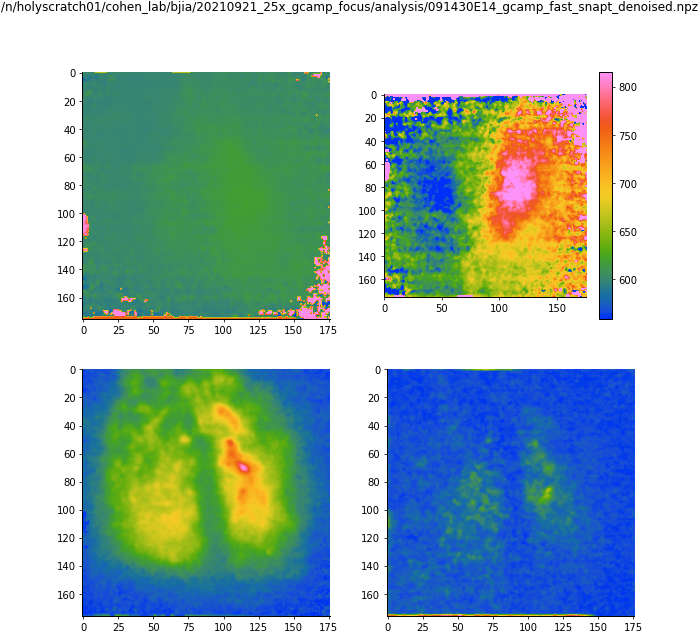

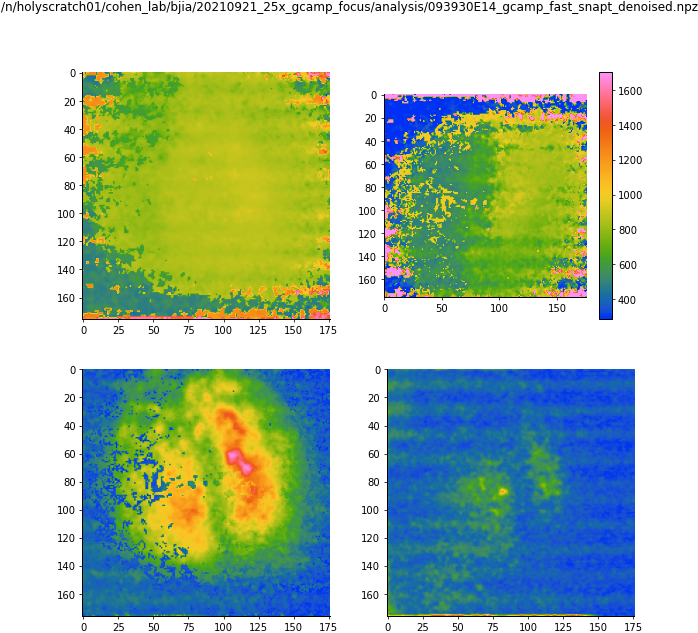

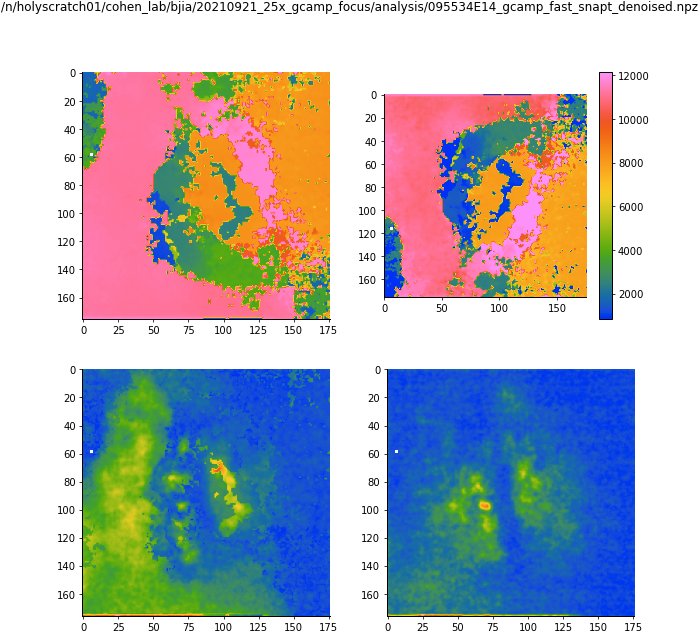

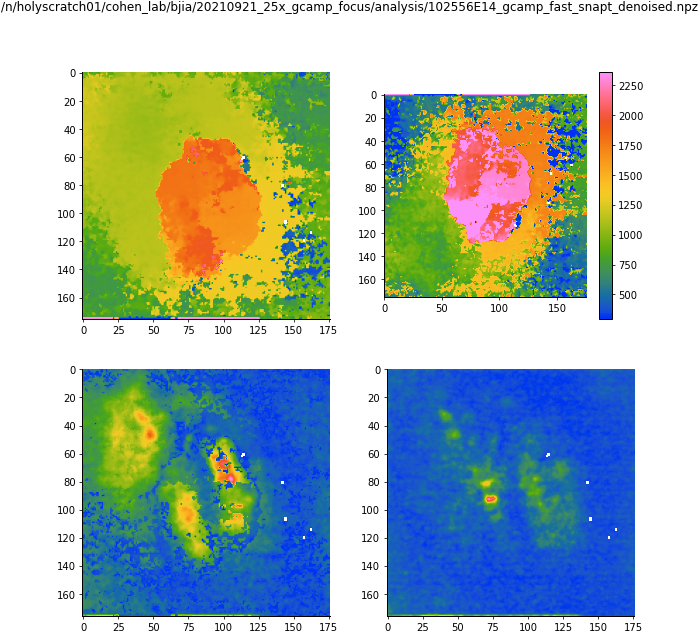

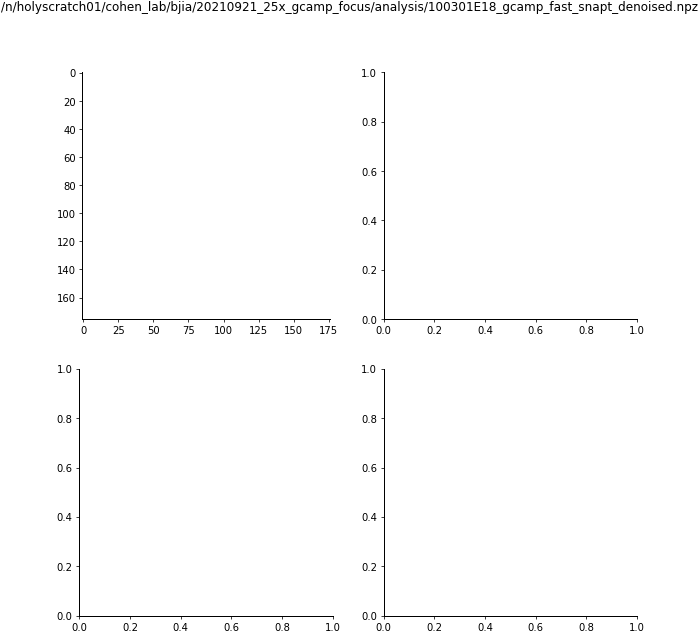

...

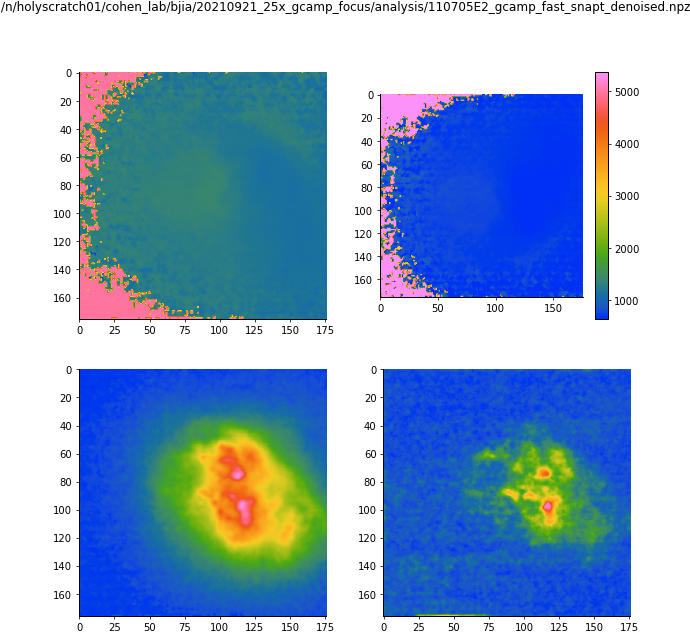

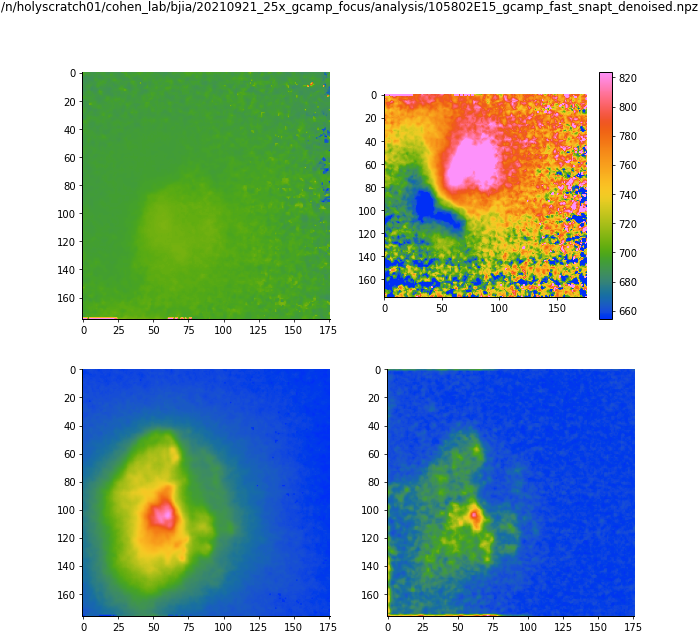

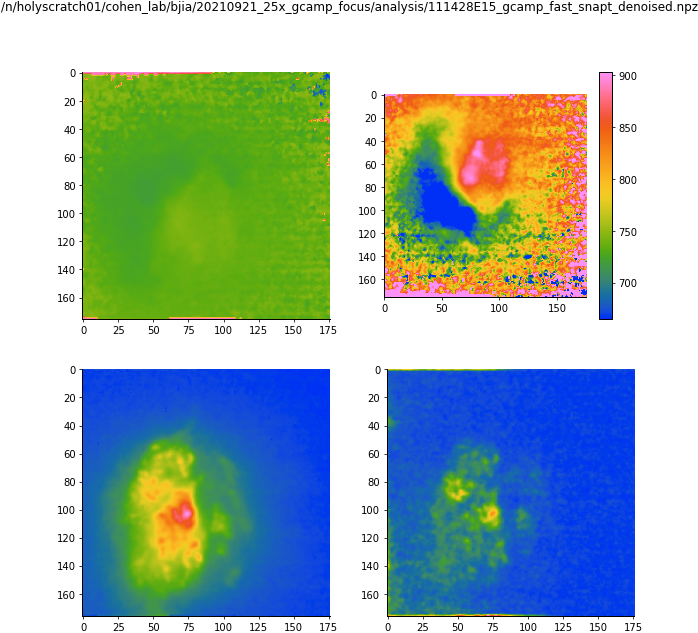

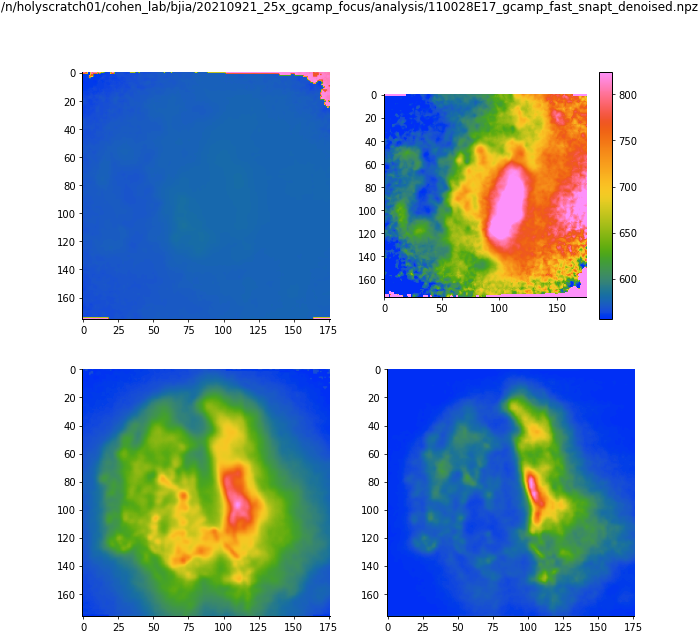

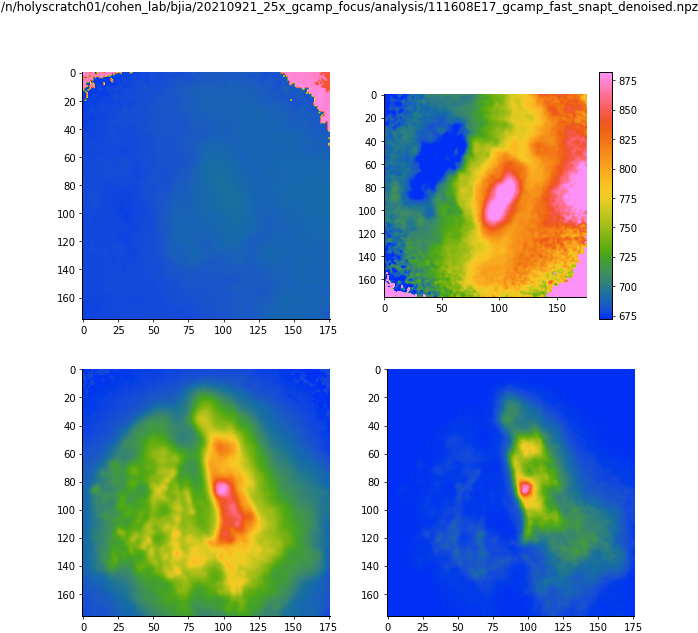

In [25]:
%matplotlib inline
plt.close('all')

for e in files_by_embryo.keys():
    timepoints = files_by_embryo[e]
    mask_idx = 0
    for t in timepoints:
        print(t)
        beta = np.load(os.path.join(rootdir, "analysis", t))["beta"]
        try:
            amplitude = beta[2,:,:]
        except Exception as err:
            print(err)
            continue
#         amplitude[np.isnan(amplitude)] = 0
#         mask = masks_by_embryo[e][mask_idx]
        hm_time = beta[1,:,:]*dt*1000
#         hm_time[~mask] = np.nan
        fig1, axes = plt.subplots(2,2,figsize=(10,10))
        axes = axes.ravel()
        fig1.suptitle(t)

        try:
            for i, ax in enumerate(axes):
                if i == 1:
                    im = axes[1].imshow(np.flipud(hm_time), vmin=np.percentile(hm_time[~np.isnan(hm_time)],5), vmax=np.percentile(hm_time[~np.isnan(hm_time)],95))
                    plt.colorbar(im, ax=axes[1])
                else:
                    ax.imshow(beta[i,:,:])
        except Exception as err:
            continue
        mask_idx +=1
    

[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_smoothed.npz'


<ipython-input-92-2d4f483e4eb0>:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, axes = plt.subplots(1,2, figsize=(12,6))


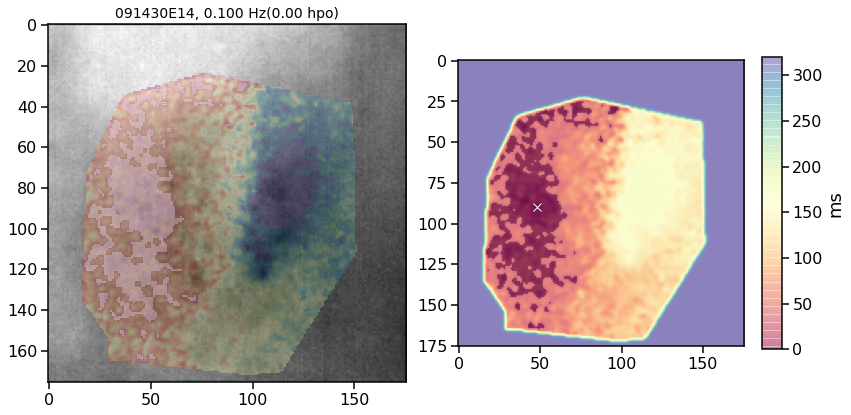

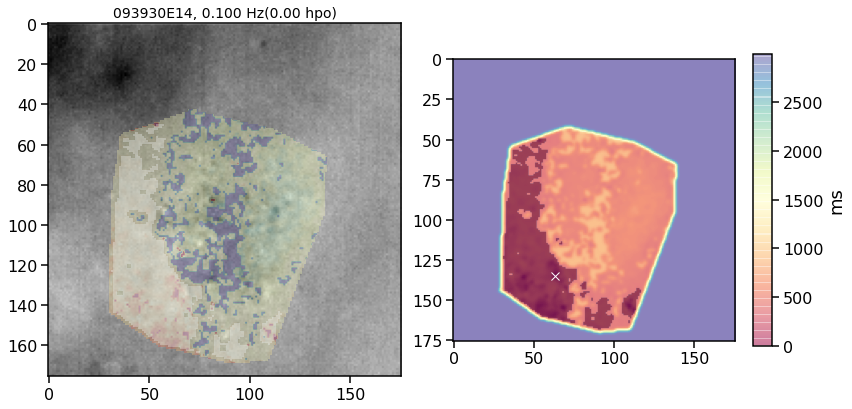

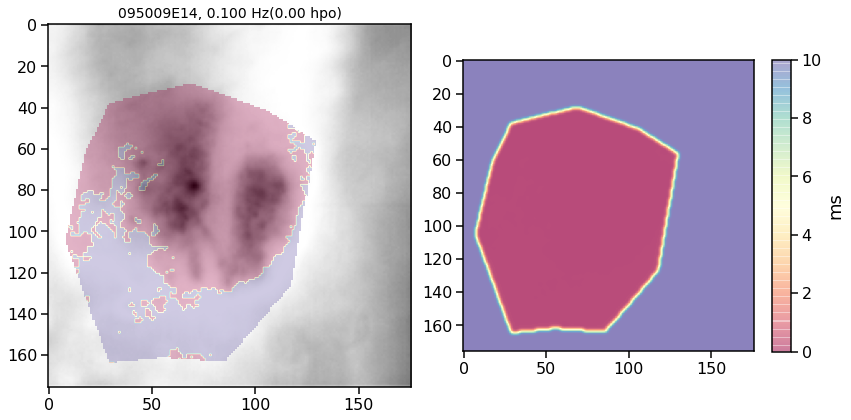

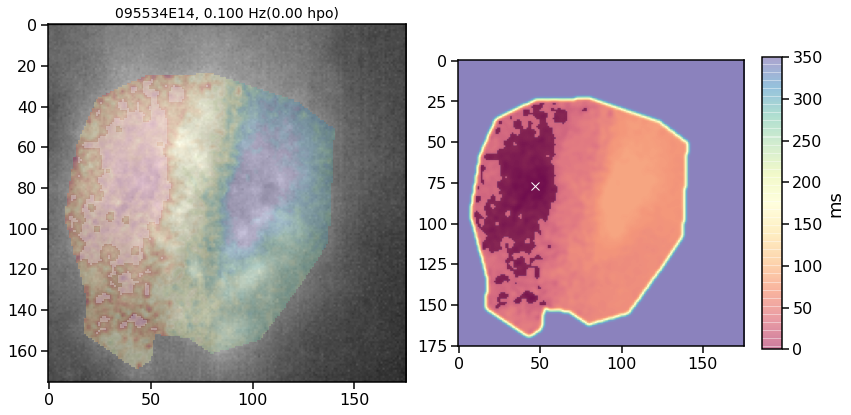

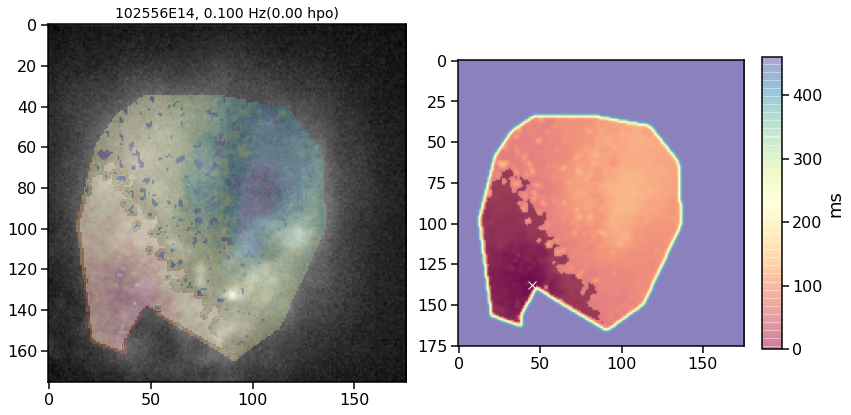

...

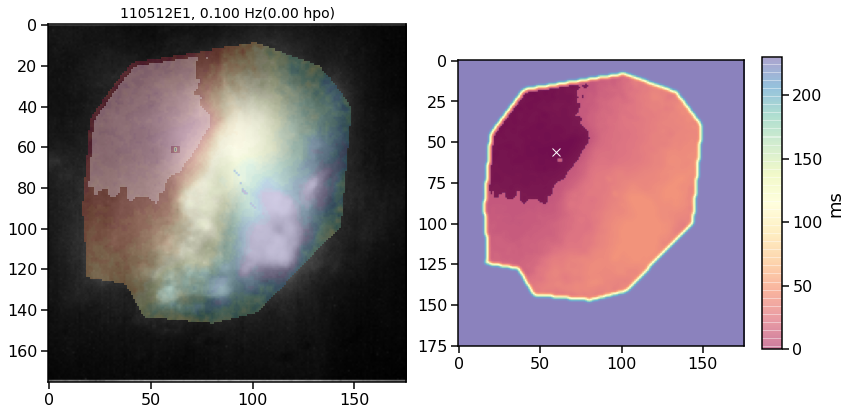

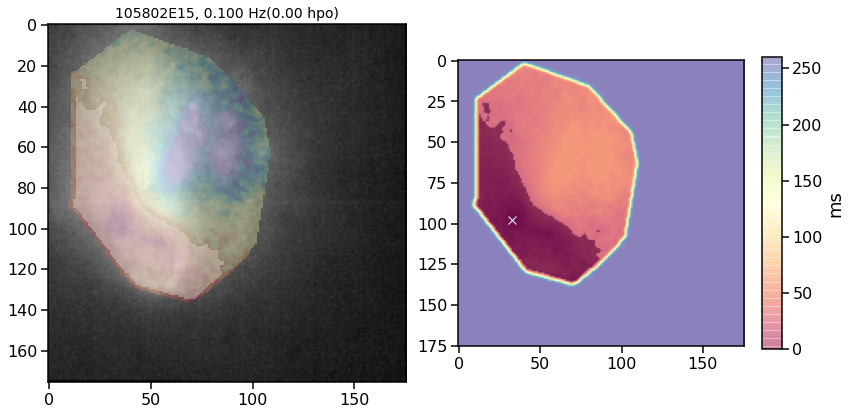

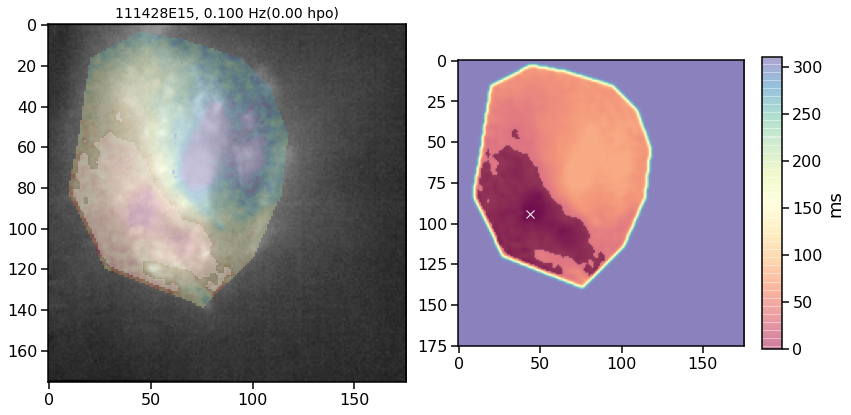

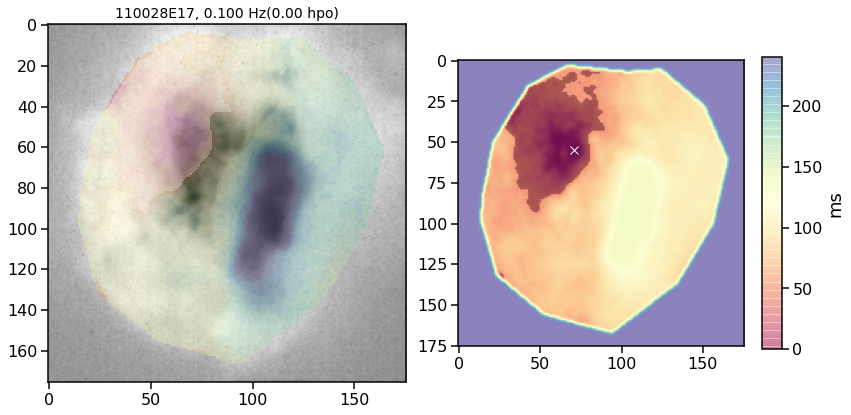

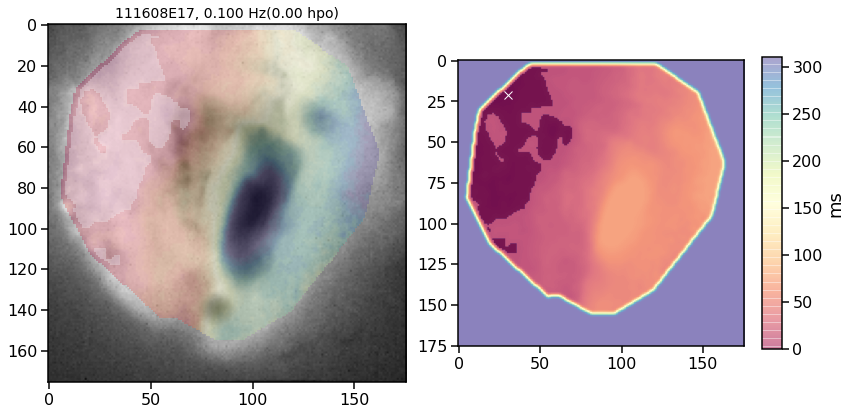

In [92]:
%matplotlib inline
plt.close('all')

for e in list(files_by_embryo.keys()):
    timepoints = files_by_embryo[e]
    mask_idx = 0
    for t in timepoints:
        try:
            beta = np.load(t.replace("snapt.npz", "snapt_smoothed.npz"))["beta"]
            pca_morphology = skio.imread(t.replace("_snapt.npz", "/pca.tif"))
            
            amplitude = beta[2,:,:]
        except Exception as err:
            print(err)
            continue
        amplitude[np.isnan(amplitude)] = 0
        mask = masks_by_embryo[e][mask_idx]
        hm_time = beta[1,:,:]/fs
        hm_time_old = np.copy(hm_time)
        hm_time[~mask] = np.nan
        
        pmin, pmax = np.percentile(hm_time[~np.isnan(hm_time)],[0.5, 95])
        hm_time[hm_time < pmin] = pmin
        hm_time[hm_time > pmax] = pmax
        hm_time = hm_time-np.min(hm_time[~np.isnan(hm_time)])
        
        hm_time_smoothed = np.copy(hm_time)
        hm_time_smoothed[np.isnan(hm_time_smoothed)] = pmax
        hm_time_smoothed = np.flipud(ndimage.gaussian_filter(hm_time_smoothed, 1))
        try:
            focus_mask = hm_time_smoothed < np.percentile(hm_time_smoothed, 10)
            labels, num = label(focus_mask, return_num=True)
            region_sizes = [np.sum(1/(hm_time_smoothed[labels==i]+0.01)) for i in np.arange(1, num+1)]
            single_region_mask = labels == (np.argmax(region_sizes)+1)
            masked_hm_time = np.ma.masked_array(hm_time_smoothed, ~single_region_mask)
            min_index = np.unravel_index(np.ma.argmin(masked_hm_time), hm_time.shape)
        except Exception:
            min_index = [np.nan, np.nan]
        
#         hm_time_nonan = np.copy(hm_time)
#         hm_time_nonan[np.isnan(hm_time)] = pmax
#         x, y = np.meshgrid(np.arange(hm_time.shape[0]), np.arange(hm_time.shape[0]))
#         x = x.ravel()
#         y = y.ravel()
#         spl = interpolate.SmoothBivariateSpline(x,y,hm_time_nonan.ravel(), s = 0.005)
#         hm_time_interp = spl.ev(x,y).reshape(hm_time_nonan.shape)
        
        
#         gx, gy = np.gradient(hm_time)
#         grd = np.sqrt(gx**2 + gy**2)
        fig1, axes = plt.subplots(1,2, figsize=(12,6))
        axes = axes.ravel()
        axes[0].imshow(np.flipud(pca_morphology), cmap="gray")
#         im = axes.contour(np.flipud(hm_time)*1000)
        im = axes[0].imshow(np.flipud(hm_time)*1000, alpha=0.3)
        axes[0].imshow(np.ma.masked_array(focus_mask, ~focus_mask), alpha=0.3, cmap="Blues")
        plt.colorbar(im, label="ms", aspect=15, shrink=0.75)
#         freq = n_peaks_by_embryo[e][mask_idx]/30
        freq = 0.1
        hpo = 0
        axes[0].set_title("%s, %.3f Hz(%.2f hpo)" %(os.path.basename(t).replace("_gcamp_fast_snapt.npz", ""), freq, hpo), fontsize=14)

        axes[1].imshow(hm_time_smoothed)
#         im = axes.contour(np.flipud(hm_time)*1000)
        axes[1].imshow(focus_mask, alpha=0.3, cmap="Blues")
        axes[1].plot(min_index[1], min_index[0], "wx")
#         mi2 = np.unravel_index(np.argmin(hm_time_smoothed), hm_time_smoothed.shape)
#         axes[1].plot(mi2[1], mi2[0], "kx")
    
        control_points_by_embryo[e][mask_idx].append([min_index[1], min_index[0]])
        plt.tight_layout()
        mask_idx +=1

In [93]:
f = open(os.path.join(rootdir, "analysis", "control_points_with_focus.pickle"), "wb")
pickle.dump(control_points_by_embryo, f)
f.close()